<a href="https://colab.research.google.com/github/meichenfang/Poisson-regression/blob/main/find-weight.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction

**Denote the gene expression matrix by $X_{ij}$ where j is gene index and i is cell index. In summary, we assume a specific model of transcription and want to solve**

\begin{align}
    & \text{argmax}_{\theta_j} \sum_{j} \sum_i \ln P(\mathcal{X}_{ij},t_i; \theta_j,\tau).
\end{align}

We assume t follows a uniform distribution on [0,1]. We use alternative minimization/EM-like algorithm to find optimal θ.

In [1]:
import time

%cd ../
from MC_functions import *
from EM_functions import *
%cd tests

/home/mffang/workspace/RNAV/Poisson-regression
/home/mffang/workspace/RNAV/Poisson-regression/tests


## EM_functions.py

## plot functions

In [2]:
def plot_t(weight,ax=None,t=None):
    m=np.shape(weight)[1]
    h=np.linspace(0,1,m)
    t_hat=np.sum(weight*h[None,:],axis=1)
    if ax is None:
        fig, ax = plt.subplots(1,1)
    if t is not None:
        ord=np.argsort(t)
        # build a rectangle in axes coords
        left, width = .25, .5
        bottom, height = .25, .5
        right = left + width
        top = bottom + height
       
        ax.imshow(weight[ord,:],aspect="auto");
        ax.text(right, top,"cor="+str(np.around(np.corrcoef(t_hat,t)[0,1],2)), horizontalalignment='right', 
                 verticalalignment='top', transform=ax.transAxes, color="white");
    else:
        ord=np.argsort(t_hat)
        ax.imshow(weight[ord,:],aspect="auto");

def plot_theta(theta,theta_hat):
    K=np.shape(theta)[1]-4
    fig, ax = plt.subplots(1,K+4,figsize=(6*(K+4),4))

    for i in range(K):
        ax[i].plot(theta[:,i],theta[:,i]);
        ax[i].plot(theta[:,i],theta_hat[:,i],'.');
        ax[i].set_title("a"+str(i+1))
        ax[i].set_xlabel("true values")

    ax[-4].plot(theta[:,-4],theta[:,-4]);
    ax[-4].plot(theta[:,-4],theta_hat[:,-4],'.');
    ax[-4].set_title("u0")
    ax[-4].set_ylabel("fitted values")
    ax[-4].set_xlabel("true values")

    ax[-3].plot(theta[:,-3],theta[:,-3]);
    ax[-3].plot(theta[:,-3],theta_hat[:,-3],'.');
    ax[-3].set_title("s0")
    ax[-3].set_ylabel("fitted values")
    ax[-3].set_xlabel("true values")

    ax[-2].plot(theta[:,-2],theta[:,-2]);
    ax[-2].plot(theta[:,-2],theta_hat[:,-2],'.');
    ax[-2].set_title("beta");
    ax[-2].set_xlabel("true values");

    ax[-1].plot(theta[:,-1],theta[:,-1]);
    ax[-1].plot(theta[:,-1],theta_hat[:,-1],'.');
    ax[-1].set_title("gamma");
    ax[-1].set_xlabel("true values");
    
    for i in range(K+4):
        ax[i].set_xscale('log')
        ax[i].set_yscale('log')


def plot_theta_hat(theta_hat,K,gene_list):
    fig, ax = plt.subplots(K+4,1,figsize=(12,4*(K+4)))

    for i in range(K+4):
        ax[i].scatter(np.array(gene_list), np.log(theta_hat[:,i]));

    ax[0].set_title("log a1");
    ax[1].set_title("log a2");
    ax[2].set_title("log u0");
    ax[3].set_title("log s0");
    ax[4].set_title("log beta");
    ax[5].set_title("log gamma");


def plot_y(theta,theta_hat,weight,tau,gene_list):
    m=np.shape(weight)[1]
    p=np.shape(theta_hat)[0]
    h=np.linspace(0,1,m)
    t_hat=np.sum(weight*h[None,:],axis=1)
    y_hat = get_Y(theta_hat, t_hat, tau)
    y = get_Y(theta, t_hat, tau)
    fig, ax = plt.subplots(p,2,figsize=(12,4*p))
    for i in range(p):
        ax[i,0].plot(t_hat,X[:,i,0],'.',color="gray");
        ax[i,0].plot(t_hat,y_hat[:,i,0],'b.', label = 'fit');
        ax[i,0].plot(t_hat,y[:,i,0],'r.',label = 'true');
        ax[i,0].set_title(gene_list[i]+" unspliced")

        ax[i,1].plot(t_hat,X[:,i,1],'.',color="gray");
        ax[i,1].plot(t_hat,y_hat[:,i,1],'b.', label = 'fit');
        ax[i,1].plot(t_hat,y[:,i,1],'r.', label = 'true');
        ax[i,1].set_title(gene_list[i]+" spliced")
        ax[i,1].legend()



# Phase plots

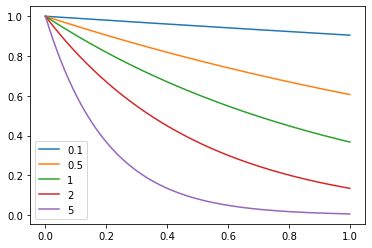

In [3]:
x = np.linspace(0,1,10000)
for beta in [0.1,0.5,1,2,5]:
    plt.plot(x, np.exp(-beta*x),label=str(beta));
plt.legend();

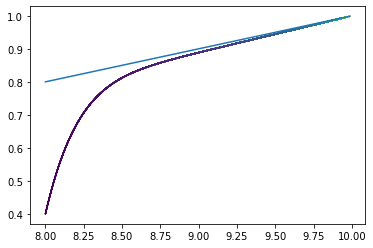

In [4]:
n=100000
beta=1
gamma=10
alpha=10
u0=8
s0=0.4

t = np.linspace(0, 5, n)
u = u0*np.exp(-beta*t) + alpha/beta*(1-np.exp(-beta*t))
s = s0*np.exp(-gamma*t) + alpha/gamma*(1-np.exp(-gamma*t)) + (alpha-beta*u0)/(gamma-beta)*(np.exp(-gamma*t)-np.exp(-beta*t))

fig, ax = plt.subplots(1,1,figsize=(6,4))
ax.plot(u,u*beta/gamma);
ax.scatter(u,s,c=t,s=0.1);

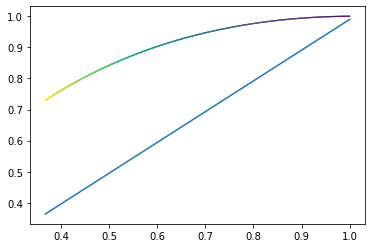

In [94]:
n=1000
beta=1
gamma=1.01
alpha=0
u0=1
s0=1

t = np.linspace(0, 1, n)
u = u0*np.exp(-beta*t) + alpha/beta*(1-np.exp(-beta*t))
s = s0*np.exp(-gamma*t) + alpha/gamma*(1-np.exp(-gamma*t)) + (alpha-beta*u0)/(gamma-beta)*(np.exp(-gamma*t)-np.exp(-beta*t))

fig, ax = plt.subplots(1,1,figsize=(6,4))
ax.plot(u,u*beta/gamma);
ax.scatter(u,s,c=t,s=0.1);

Note that inference of $\alpha$ is much accurate than $\beta$ and $\gamma$, because even under a uniform prior when n is not too large, moving $\beta$ and $\gamma$ together with posterior a little bit does not change likelihood that much

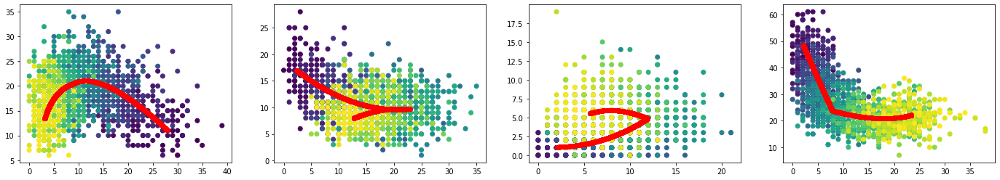

In [95]:
#%% generate data
np.random.seed(42)
n = 1500
p = 4
t = np.linspace(0, 1, n)

Tau=[0,0.5]
tau=(0,0.5,1)

K=len(tau)-1
theta=np.zeros((p,K+4))
theta[:,0]=np.exp(np.random.uniform(0,4,size=p))
theta[:,1]=np.exp(np.random.uniform(0,4,size=p))
theta[:,-3]=np.exp(np.random.uniform(0,4,size=p))
theta[:,-4]=np.exp(np.random.uniform(0,4,size=p))
theta[:,-1]=np.exp(np.random.uniform(0,2,size=p))
theta[:,-2]=np.exp(np.random.uniform(0,2,size=p))

Y = get_Y(theta,t,tau)

X = np.random.poisson(Y)

fig, ax = plt.subplots(1,p,figsize=(6*p,4))
for i in range(p):
    ax[i].scatter(X[:,i,0],X[:,i,1],c=t);
    ax[i].scatter(Y[:,i,0],Y[:,i,1],c='r');

## Given true theta, it's able to find reasonable posterior

CPU times: user 11.8 ms, sys: 0 ns, total: 11.8 ms
Wall time: 11.2 ms


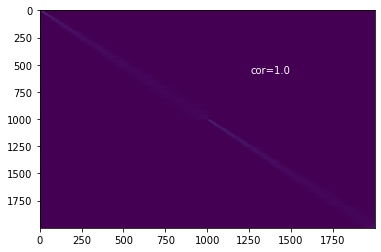

In [8]:
#%% generate data
np.random.seed(42)
n = 2000
p = 20
Tau=[0,0.5]
tau=(0,0.5,1)
K=len(tau)-1
t = np.linspace(0, 1, n)

theta=np.zeros((p,K+4))
theta[:,0]=np.exp(np.random.uniform(0,5,size=p))
theta[:,1]=np.exp(np.random.uniform(0,5,size=p))
theta[:,-3]=np.exp(np.random.uniform(0,5,size=p))
theta[:,-4]=np.exp(np.random.uniform(0,5,size=p))
theta[:,-1]=np.exp(np.random.uniform(0,3,size=p))
theta[:,-2]=np.exp(np.random.uniform(0,3,size=p))


%time Y = get_Y(theta,t,tau)

X = np.random.poisson(Y)

m=int(n/1)

weight = update_weight(X,theta,tau,m)
plot_t(weight, ax=None, t=t)

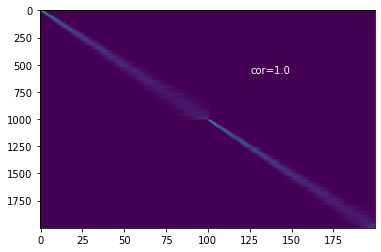

In [9]:
m=int(n/10)

weight = update_weight(X,theta,tau,m)
plot_t(weight, ax=None, t=t)

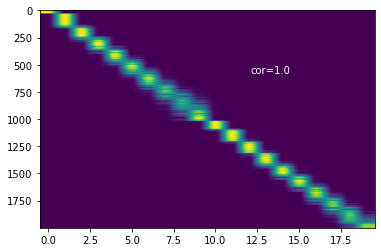

In [10]:
m=int(n/100)

weight = update_weight(X,theta,tau,m)
plot_t(weight, ax=None, t=t)

## Given true time, it's able to estimate theta

In [32]:
#%% generate data
np.random.seed(84)
n = 1500
p = 15
Tau=[0,0.5]
tau=(0,0.5,1)
K=len(tau)-1
t = np.linspace(0, 1, n)

theta=np.zeros((p,K+4))
loga_max=4
logb_max=2
theta[:,0]=np.exp(np.random.uniform(0,loga_max,size=p))-1
theta[:,1]=np.exp(np.random.uniform(0,loga_max,size=p))-1
theta[:,-4]=np.exp(np.random.uniform(0,loga_max,size=p))-1
theta[:,-3]=np.exp(np.random.uniform(0,loga_max,size=p))-1
theta[:,-2]=np.exp(np.random.uniform(0,logb_max,size=p))
theta[:,-1]=np.exp(np.random.uniform(0,logb_max,size=p))

%time Y = get_Y(theta,t,tau)

X = np.random.poisson(Y)

CPU times: user 7.99 ms, sys: 0 ns, total: 7.99 ms
Wall time: 7.17 ms


In [435]:
#%% update theta
weight=np.diag(v=[1]*n)
%time theta_hat=update_theta(X,weight,tau,parallel=True,n_threads=min(40,p),theta0=None)

CPU times: user 240 ms, sys: 896 ms, total: 1.14 s
Wall time: 1min 9s


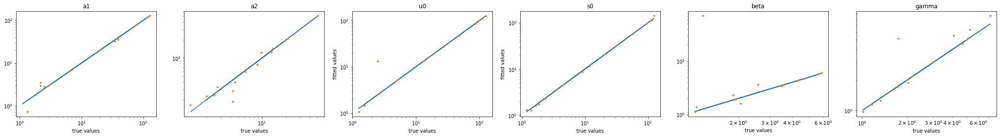

In [436]:
plot_theta(theta[:,],theta_hat)

Sat Jul  2 11:44:45 PDT 2022
CPU times: user 249 ms, sys: 865 ms, total: 1.11 s
Wall time: 3min 18s


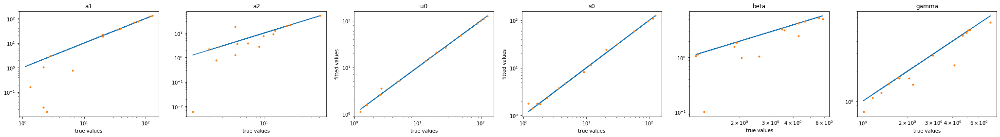

In [437]:
!date
%time theta_hat=update_theta(X,weight,tau,alternative=True, parallel=True,n_threads=min(40,p),theta0=None)
plot_theta(theta[:,],theta_hat)

## Given uninformative time, estimation is terrible

In [44]:
m=150
weight=np.ones((n,m))
weight = weight/weight.sum(axis=1,keepdims=True)

In [46]:
beta0=1
theta0 = beta0*np.ones((p,K+4))
theta0[:,0:(K+1)]=np.mean(X[:,:,0],axis=0)[:,None]
theta0[:,K+1]= np.mean(X[:,:,1],axis=0)
theta0[:,-1] = np.mean(X[:,:,0],axis=0)/(np.mean(X[:,:,1],axis=0)+eps)*beta0

In [47]:
%time theta_hat=update_theta(X,weight,tau,penalty=0,parallel=True,n_threads=min(40,p),theta0=theta0)

CPU times: user 43.3 ms, sys: 116 ms, total: 160 ms
Wall time: 401 ms


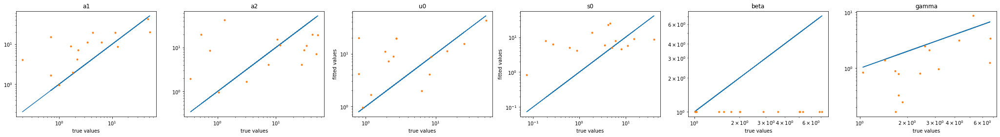

In [48]:
plot_theta(theta,theta_hat)

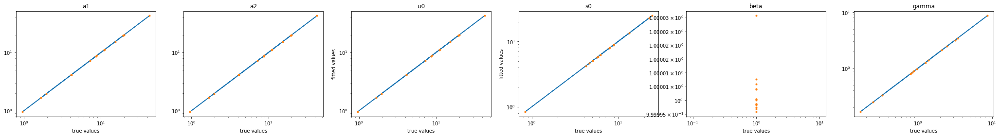

In [49]:
plot_theta(theta0,theta_hat)

In [50]:
%time theta_hat_a=update_theta(X,weight,tau,penalty=0,alternative=True, parallel=True,n_threads=min(40,p),theta0=theta0)

CPU times: user 42.8 ms, sys: 120 ms, total: 162 ms
Wall time: 25.5 s


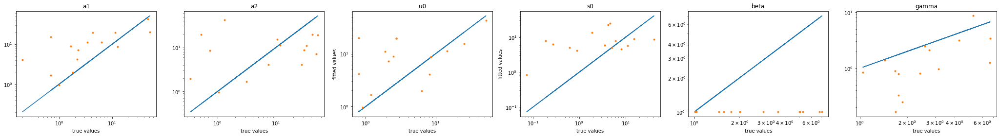

In [51]:
plot_theta(theta,theta_hat_a)

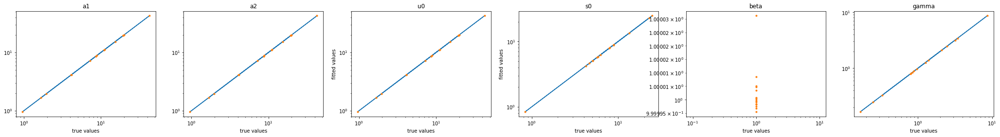

In [52]:
plot_theta(theta0,theta_hat_a)

In [62]:
n,p,s=np.shape(X)
t=np.linspace(0,1,m)
Y = get_Y(theta_hat,t,tau) # m*p*2
Y = Y[None,:,:,:] # 1*m*p*2
logL =  np.sum(X[:,None,:,:] * np.log(Y+eps) - Y, axis=(2,3)) # n*m*p*2 -> n*m
w = np.zeros((n,m))
for i in range(n):
    c = np.max(logL[i,:])
    relative_logL = logL[i,:]-c        
    relative_logL[relative_logL<omega]=omega
    L = np.exp(relative_logL)
    w[i,:] = L/L.sum()

In [63]:
Y[0,:,0,0]

array([4.10733391, 4.10733391, 4.10733391, 4.10733391, 4.1073339 ,
       4.1073339 , 4.1073339 , 4.1073339 , 4.1073339 , 4.1073339 ,
       4.10733389, 4.10733389, 4.10733389, 4.10733389, 4.10733389,
       4.10733388, 4.10733388, 4.10733388, 4.10733388, 4.10733388,
       4.10733388, 4.10733387, 4.10733387, 4.10733387, 4.10733387,
       4.10733387, 4.10733387, 4.10733386, 4.10733386, 4.10733386,
       4.10733386, 4.10733386, 4.10733386, 4.10733386, 4.10733385,
       4.10733385, 4.10733385, 4.10733385, 4.10733385, 4.10733385,
       4.10733384, 4.10733384, 4.10733384, 4.10733384, 4.10733384,
       4.10733384, 4.10733384, 4.10733383, 4.10733383, 4.10733383,
       4.10733383, 4.10733383, 4.10733383, 4.10733383, 4.10733382,
       4.10733382, 4.10733382, 4.10733382, 4.10733382, 4.10733382,
       4.10733382, 4.10733382, 4.10733381, 4.10733381, 4.10733381,
       4.10733381, 4.10733381, 4.10733381, 4.10733381, 4.10733381,
       4.1073338 , 4.1073338 , 4.1073338 , 4.1073338 , 4.10733

In [64]:
logL[0]

array([247.10043606, 247.10043638, 247.10043668, 247.10043698,
       247.10043727, 247.10043755, 247.10043783, 247.10043809,
       247.10043836, 247.10043861, 247.10043886, 247.1004391 ,
       247.10043934, 247.10043956, 247.10043979, 247.10044001,
       247.10044022, 247.10044043, 247.10044063, 247.10044083,
       247.10044102, 247.10044121, 247.1004414 , 247.10044158,
       247.10044175, 247.10044192, 247.10044209, 247.10044225,
       247.10044241, 247.10044257, 247.10044272, 247.10044287,
       247.10044302, 247.10044316, 247.1004433 , 247.10044343,
       247.10044356, 247.10044369, 247.10044382, 247.10044394,
       247.10044406, 247.10044418, 247.10044429, 247.10044441,
       247.10044452, 247.10044462, 247.10044473, 247.10044483,
       247.10044493, 247.10044503, 247.10044512, 247.10044522,
       247.10044531, 247.1004454 , 247.10044549, 247.10044557,
       247.10044565, 247.10044574, 247.10044582, 247.10044589,
       247.10044597, 247.10044604, 247.10044612, 247.10

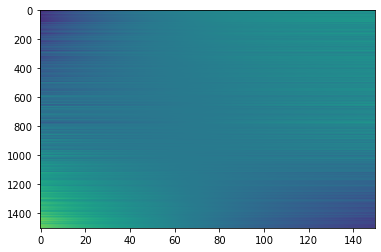

In [67]:
plt.imshow(w,aspect="auto");

In [53]:
weight = update_weight(X,theta_hat,tau,m)

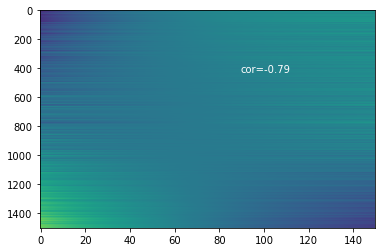

In [54]:
plot_t(weight, ax=None, t=t)

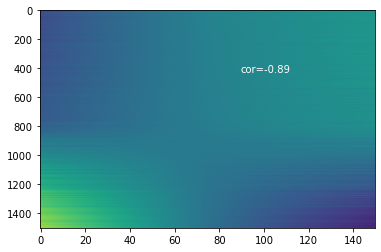

In [55]:
weight = update_weight(X,theta_hat_a,tau,m)
plot_t(weight, ax=None, t=t)

### Therefor, a warm start is necessary!

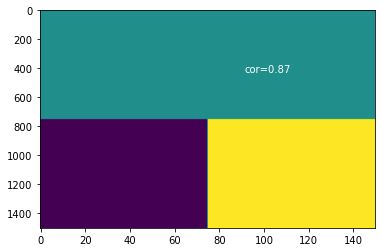

In [7]:
m=int(n/10)
weight0=np.ones((n,m))
weight0[int(n/2):,int(m/2):] += 0.1
weight0 = weight0/weight0.sum(axis=1,keepdims=True)
plot_t(weight0, ax=None, t=t)

In [35]:
%time theta_hat=update_theta(X,weight,tau,penalty=0,parallel=True,n_threads=min(40,p),theta0=theta0)

CPU times: user 42.7 ms, sys: 121 ms, total: 164 ms
Wall time: 2.85 s


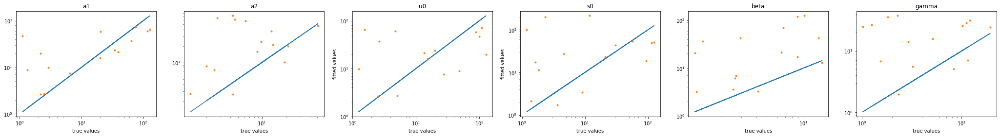

In [36]:
plot_theta(theta,theta_hat)

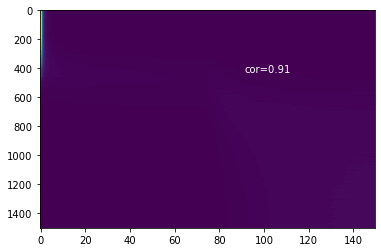

In [37]:
weight = update_weight(X,theta_hat,tau,m)
plot_t(weight, ax=None, t=t)

## traj_EM

### Close look at one example

In [40]:
#%% generate data
np.random.seed(2022)
n = 1500
p = 15
t = np.linspace(0, 1, n)

Tau=[0,0.5]
tau=(0,0.5,1)

K=len(tau)-1
theta=np.zeros((p,K+4))
theta[:,0]=np.exp(np.random.uniform(0,5,size=p))
theta[:,1]=np.exp(np.random.uniform(0,5,size=p))
theta[:,-3]=np.exp(np.random.uniform(0,5,size=p))
theta[:,-4]=np.exp(np.random.uniform(0,5,size=p))
theta[:,-1]=np.exp(np.random.uniform(0,3,size=p))
theta[:,-2]=np.exp(np.random.uniform(0,3,size=p))

Y = get_Y(theta,t,tau)

X = np.random.poisson(Y)

theta_hat_hist, weight_hist = traj_EM(X, tau, weight0, epoch=20, parallel = True, n_threads = min(40,p))

100%|██████████| 20/20 [00:46<00:00,  2.35s/it]


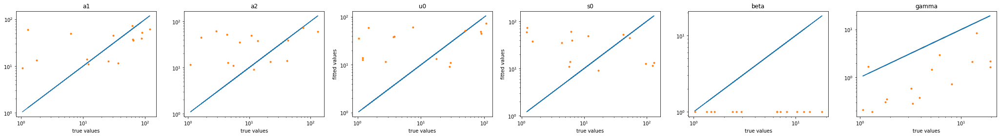

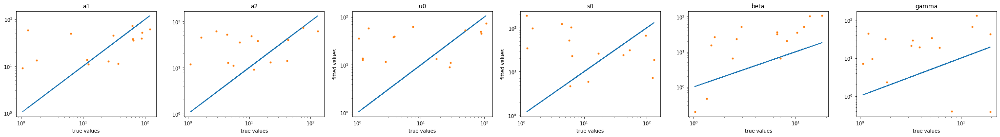

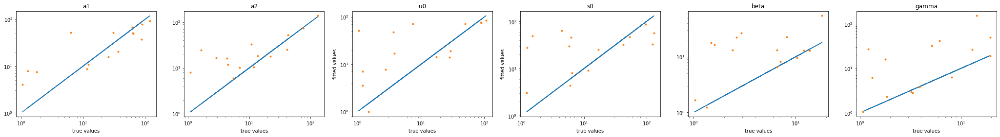

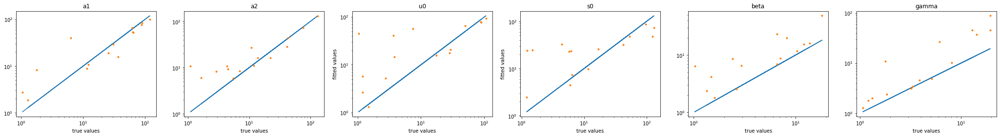

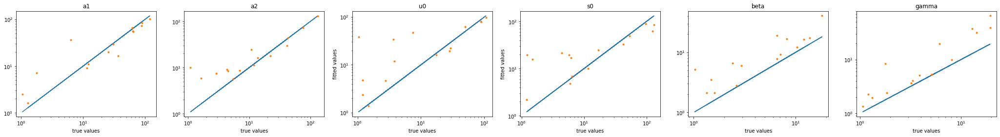

...

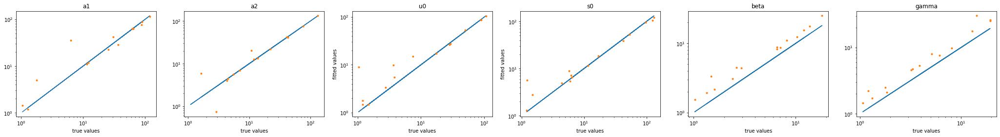

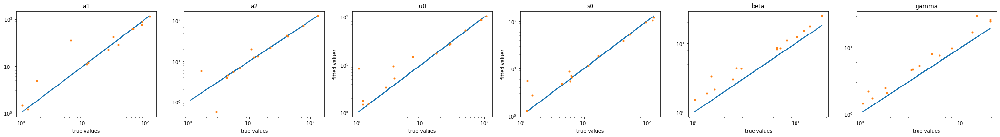

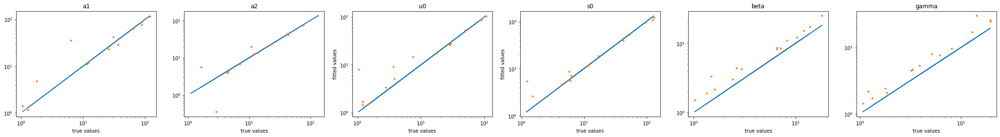

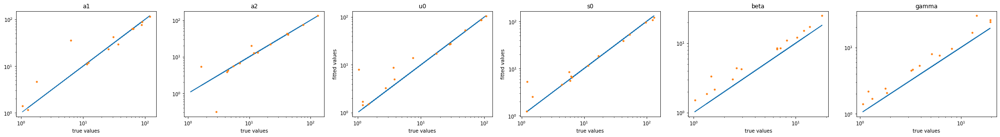

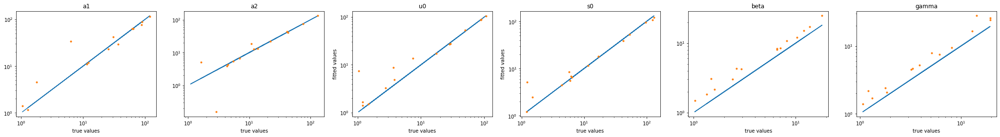

In [41]:
for i in range(20):
  plot_theta(theta,theta_hat_hist[i])

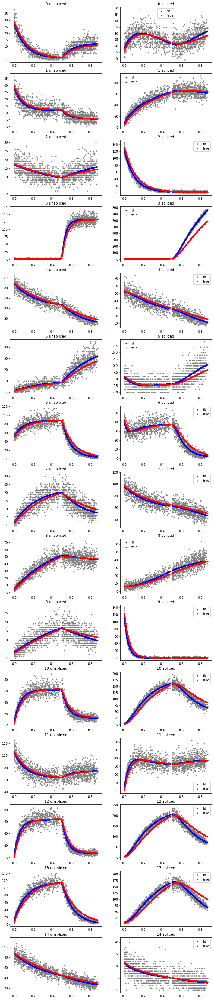

In [43]:
plot_y(theta,theta_hat_hist[-1],weight_hist[-1],tau,[str(i) for i in range(20)])

# Test

An informative gene should have moderate beta and gamma value, not too small so that there are dynamics, and also not too large so that the dynamics are a significant part of data.

In [112]:
def get_fit_result(n, rs=[0.01, 1/30, 0.1], warm=True, noise=False, true_tau=None, loga_max=4, logb_max=2, seeds=[21, 42, 63, 84], cores=20):
    tau=(0,0.5,1)
    if true_tau is None:
        true_tau=tau
    K=len(tau)-1
    t = np.linspace(0, 1, n)

    m=int(n/10)
    weight0=np.ones((n,m))
    if warm:
        weight0[int(n/2):,int(m/2):] += 0.1
    weight0 = weight0/weight0.sum(axis=1,keepdims=True)
    
    if noise:
        np.random.shuffle(weight0[int(n/4):int(3*n/4)])
    
    #fig, axs = plt.subplots(len(rs), K+4+len(seeds), figsize=(6*(K+4+len(seeds)),4*len(rs)))
    thetas=[]
    theta_hats=[]
    weights=[]
    
    for i,r in enumerate(rs): 
        p = int(n*r)  
        for j,seed in enumerate(seeds):
            np.random.seed(seed)
            theta=np.zeros((p,K+4))
            theta[:,0]=np.exp(np.random.uniform(0,loga_max,size=p))-1
            theta[:,1]=np.exp(np.random.uniform(0,loga_max,size=p))-1
            theta[:,-4]=np.exp(np.random.uniform(0,loga_max,size=p))-1
            theta[:,-3]=np.exp(np.random.uniform(0,loga_max,size=p))-1
            theta[:,-2]=np.exp(np.random.uniform(0,logb_max,size=p))
            theta[:,-1]=np.exp(np.random.uniform(0,logb_max,size=p))
            thetas.append(theta)
            
            Y = get_Y(theta,t,true_tau)
            X = np.random.poisson(Y)

            theta_hat_hist, weight_hist = traj_EM(X, tau, weight0, epoch=20, parallel = True, n_threads = min(cores,p))
            theta_hat = theta_hat_hist[-1]
            theta_hats.append(theta_hat)
            weight=weight_hist[-1]
            weights.append(weight)
    
    return thetas, theta_hats, weights


def plot_fit_result(n, rs=[0.01, 1/30, 0.1], warm=True, shuffle=False, true_tau=None, loga_max=4, logb_max=2, seeds=[21, 42, 63, 84], cores=20, output=False):
    tau=(0,0.5,1)
    if true_tau is None:
        true_tau=tau
    K=len(tau)-1
    t = np.linspace(0, 1, n)

    m=int(n/10)
    weight0=np.ones((n,m))
    if warm:
        weight0[int(n/2):,int(m/2):] += 0.1
    weight0 = weight0/weight0.sum(axis=1,keepdims=True)
    
    if shuffle:
        np.random.shuffle(weight0[int(n/4):int(3*n/4)])

    
    fig, axs = plt.subplots(len(rs), K+4+len(seeds), figsize=(6*(K+4+len(seeds)),4*len(rs)))
    thetas=[]
    theta_hats=[]
    weights=[]
    
    for i,r in enumerate(rs): 
        p = int(n*r)  
        for j,seed in enumerate(seeds):
            np.random.seed(seed)
            theta=np.zeros((p,K+4))
            theta[:,0]=np.exp(np.random.uniform(0,loga_max,size=p))-1
            theta[:,1]=np.exp(np.random.uniform(0,loga_max,size=p))-1
            theta[:,-4]=np.exp(np.random.uniform(0,loga_max,size=p))-1
            theta[:,-3]=np.exp(np.random.uniform(0,loga_max,size=p))-1
            theta[:,-2]=np.exp(np.random.uniform(0,logb_max,size=p))
            theta[:,-1]=np.exp(np.random.uniform(0,logb_max,size=p))
            thetas.append(theta)
            
            Y = get_Y(theta,t,true_tau)
            X = np.random.poisson(Y)

            theta_hat_hist, weight_hist = traj_EM(X, tau, weight0, epoch=20, parallel = True, n_threads = min(cores,p))
            theta_hat = theta_hat_hist[-1]
            theta_hats.append(theta_hat)
            weight=weight_hist[-1]
            weights.append(weight)
            
            for k in range(K+4):
                axs[i,k].loglog(theta[:,k],theta_hat[:,k],'.')
                axs[i,k].loglog(theta[:,k],theta[:,k],'k')
    
            plot_t(weight, ax=axs[i,K+4+j], t=t)
        
    if output:
        return thetas, theta_hats, weights
    else:
        return


## Warm start and different n

100%|██████████| 20/20 [07:32<00:00, 22.64s/it]


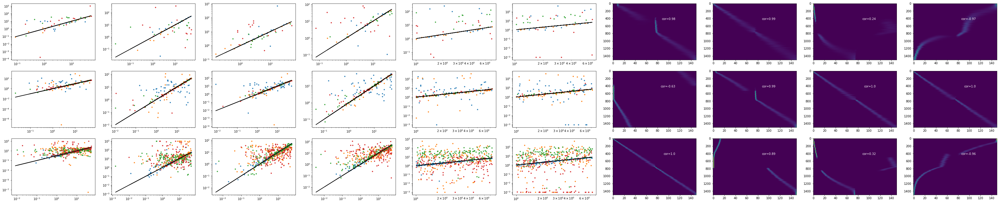

In [116]:
thetas, theta_hats, weights = plot_fit_result(1500, warm=False, cores=10, output=True) 

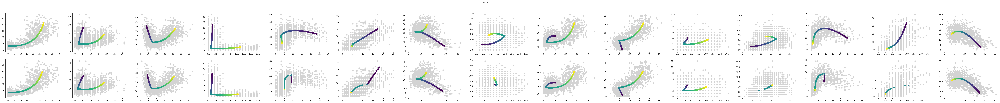

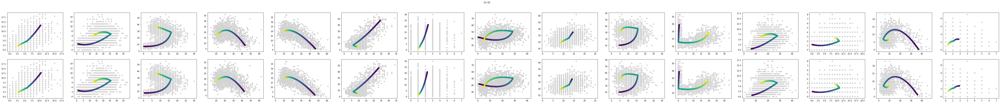

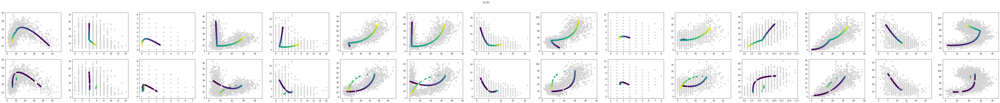

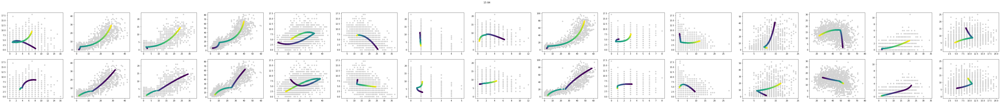

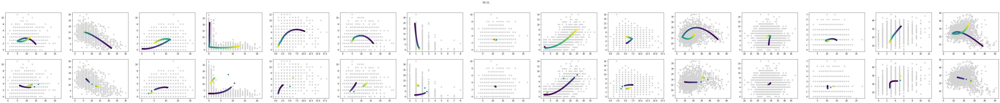

...

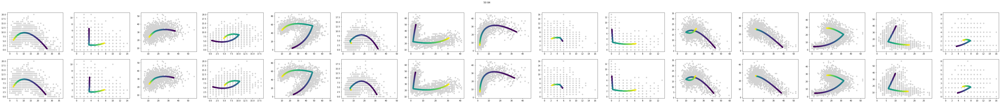

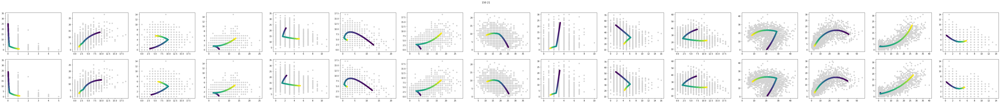

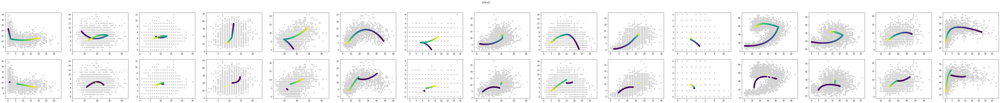

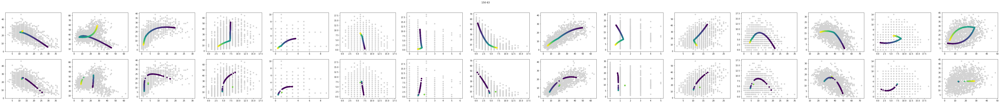

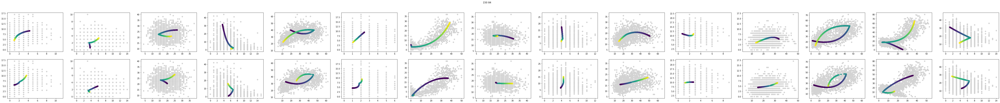

In [129]:
n=1500
m=150
rs=[0.01, 1/30, 0.1]
warm=True
shuffle=False
tau=(0,0.5,1)
true_tau=tau
loga_max=4
logb_max=2
seeds=[21, 42, 63, 84]
t=np.linspace(0, 1, n)
h=np.linspace(0,1,m)

for i,r in enumerate(rs): 
    p = int(n*r)  
    for j,seed in enumerate(seeds):
        idx = len(seeds)*i+j
        theta = thetas[idx]
        theta_hat = theta_hats[idx]
        weight = weights[idx]
        
        fig, axs = plt.subplots(2, 15, figsize=(6*15,4*2))
        fig.suptitle(str(p)+" "+str(seed))

        Y = get_Y(theta,t,true_tau)
        X = np.random.poisson(Y)
        
        t_hat = np.sum(weight*h[None,:],axis=1)
        Y_hat = get_Y(theta_hat,t_hat,true_tau)
        
        for k in range(15):
            axs[0,k].scatter(X[:,k,0],X[:,k,1],color='lightgray')
            axs[0,k].scatter(Y[:,k,0],Y[:,k,1],c=t)
        
        for k in range(15):
            axs[1,k].scatter(X[:,k,0],X[:,k,1],color='lightgray')
            axs[1,k].scatter(Y_hat[:,k,0],Y_hat[:,k,1],c=t_hat)
        

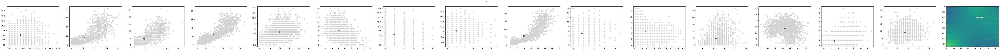

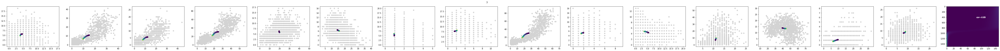

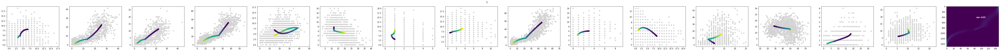

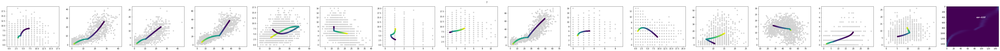

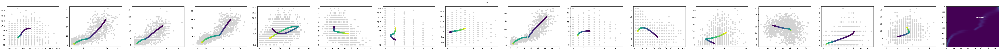

In [134]:
n=1500
m=150
r=0.01
warm=True
shuffle=False
tau=(0,0.5,1)
true_tau=tau
loga_max=4
logb_max=2
seed=84
t=np.linspace(0, 1, n)
h=np.linspace(0,1,m)

p = int(n*r)  
np.random.seed(seed)
theta=np.zeros((p,K+4))
theta[:,0]=np.exp(np.random.uniform(0,loga_max,size=p))-1
theta[:,1]=np.exp(np.random.uniform(0,loga_max,size=p))-1
theta[:,-4]=np.exp(np.random.uniform(0,loga_max,size=p))-1
theta[:,-3]=np.exp(np.random.uniform(0,loga_max,size=p))-1
theta[:,-2]=np.exp(np.random.uniform(0,logb_max,size=p))
theta[:,-1]=np.exp(np.random.uniform(0,logb_max,size=p))

Y = get_Y(theta,t,true_tau)
X = np.random.poisson(Y)

weight0=np.ones((n,m))/m
theta_hat_hist, weight_hist = traj_EM(X, tau, weight0, epoch=10, parallel = True, n_threads = min(15,p))
for i in range(1,10,2):
    weight=weight_hist[i]
    theta_hat=theta_hat_hist[i]
    t_hat = np.sum(weight*h[None,:],axis=1)
    Y_hat = get_Y(theta_hat,t_hat,true_tau)
    
    fig, axs = plt.subplots(1, 16, figsize=(6*16,4))
    fig.suptitle(str(i))
    for k in range(15):
        axs[k].scatter(X[:,k,0],X[:,k,1],color='lightgray')
        axs[k].scatter(Y_hat[:,k,0],Y_hat[:,k,1],c=t_hat)
        plot_t(weight_hist[i], ax=axs[-1], t=t)

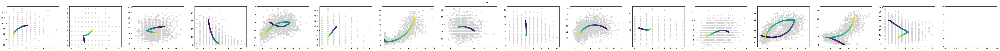

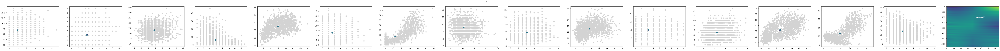

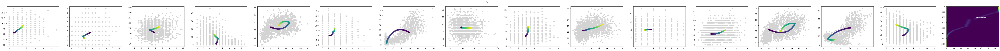

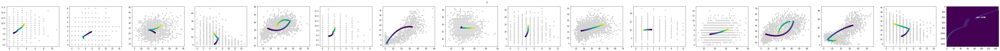

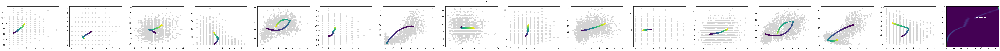

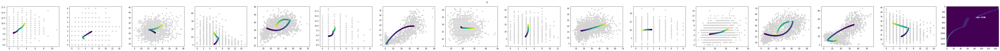

In [137]:
n=1500
m=int(n/10)
r=0.1
warm=True
shuffle=False
tau=(0,0.5,1)
true_tau=tau
loga_max=4
logb_max=2
seed=84
t=np.linspace(0, 1, n)
h=np.linspace(0,1,m)

p = int(n*r)  
np.random.seed(seed)
theta=np.zeros((p,K+4))
theta[:,0]=np.exp(np.random.uniform(0,loga_max,size=p))-1
theta[:,1]=np.exp(np.random.uniform(0,loga_max,size=p))-1
theta[:,-4]=np.exp(np.random.uniform(0,loga_max,size=p))-1
theta[:,-3]=np.exp(np.random.uniform(0,loga_max,size=p))-1
theta[:,-2]=np.exp(np.random.uniform(0,logb_max,size=p))
theta[:,-1]=np.exp(np.random.uniform(0,logb_max,size=p))

Y = get_Y(theta,t,true_tau)
X = np.random.poisson(Y)

fig, axs = plt.subplots(1, 16, figsize=(6*16,4))
fig.suptitle("true")
for k in range(15):
    axs[k].scatter(X[:,k,0],X[:,k,1],color='lightgray')
    axs[k].scatter(Y[:,k,0],Y[:,k,1],c=t)
  
weight0=np.ones((n,m))/m
theta_hat_hist, weight_hist = traj_EM(X, tau, weight0, epoch=10, parallel = True, n_threads = min(15,p))

for i in range(1,10,2):
    weight=weight_hist[i]
    theta_hat=theta_hat_hist[i]
    t_hat = np.sum(weight*h[None,:],axis=1)
    Y_hat = get_Y(theta_hat,t_hat,true_tau)
    
    fig, axs = plt.subplots(1, 16, figsize=(6*16,4))
    fig.suptitle(str(i))
    for k in range(15):
        axs[k].scatter(X[:,k,0],X[:,k,1],color='lightgray')
        axs[k].scatter(Y_hat[:,k,0],Y_hat[:,k,1],c=t_hat)
        plot_t(weight_hist[i], ax=axs[-1], t=t)

100%|██████████| 20/20 [07:58<00:00, 23.95s/it]


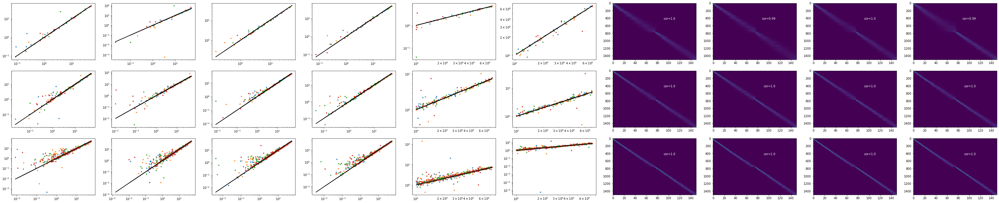

In [23]:
plot_fit_result(1500, warm=True, shuffle=True)

100%|██████████| 20/20 [06:20<00:00, 19.04s/it]


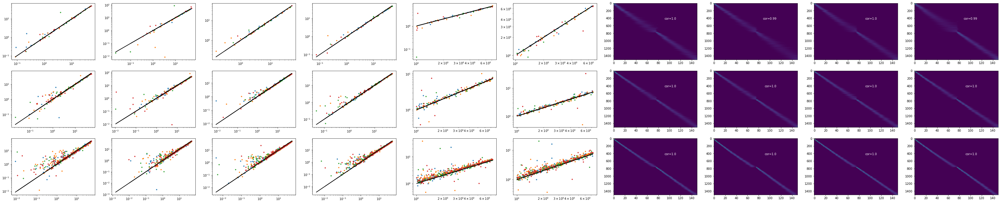

In [11]:
plot_fit_result(1500, warm=True)

100%|██████████| 20/20 [12:46<00:00, 38.34s/it]


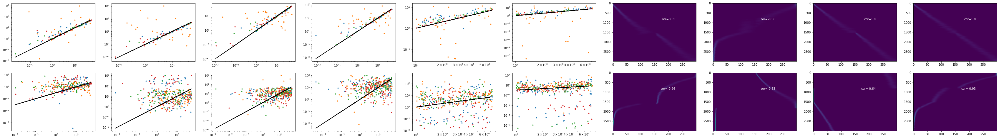

In [25]:
plot_fit_result(3000, rs=[0.01, 1/30], warm=False)

100%|██████████| 20/20 [13:28<00:00, 40.42s/it]


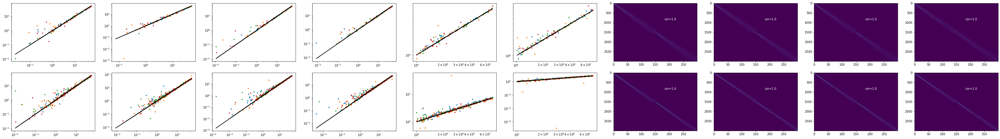

In [24]:
plot_fit_result(3000, rs=[0.01, 1/30], warm=True, shuffle=True)

100%|██████████| 20/20 [13:40<00:00, 41.04s/it]


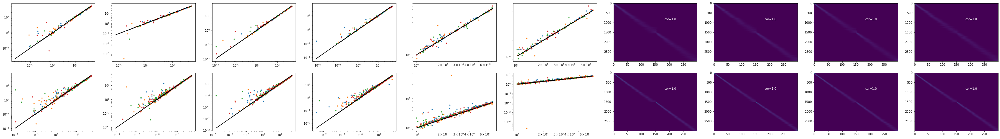

In [13]:
plot_fit_result(3000, rs=[0.01, 1/30], warm=True)

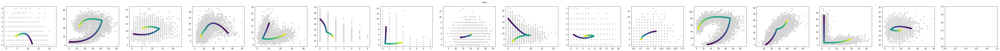

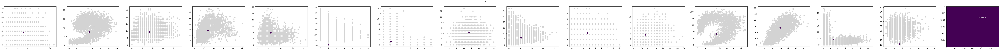

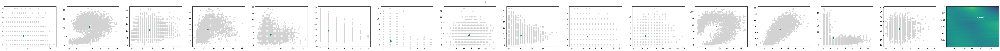

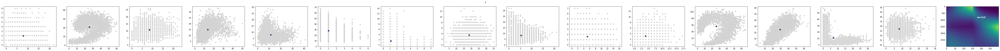

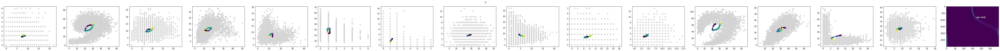

...

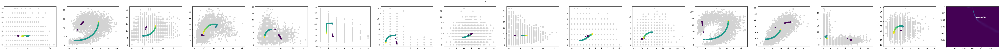

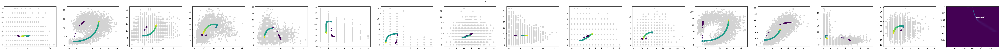

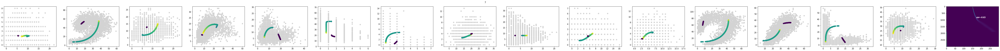

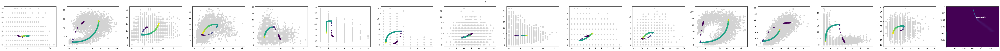

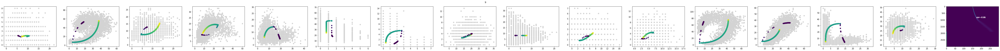

In [142]:
n=3000
m=int(n/10)
r=1/30
warm=True
shuffle=False
tau=(0,0.5,1)
true_tau=tau
loga_max=4
logb_max=2
seed=42
t=np.linspace(0,1,n)
h=np.linspace(0,1,m)

p = int(n*r)  
np.random.seed(seed)
theta=np.zeros((p,K+4))
theta[:,0]=np.exp(np.random.uniform(0,loga_max,size=p))-1
theta[:,1]=np.exp(np.random.uniform(0,loga_max,size=p))-1
theta[:,-4]=np.exp(np.random.uniform(0,loga_max,size=p))-1
theta[:,-3]=np.exp(np.random.uniform(0,loga_max,size=p))-1
theta[:,-2]=np.exp(np.random.uniform(0,logb_max,size=p))
theta[:,-1]=np.exp(np.random.uniform(0,logb_max,size=p))

Y = get_Y(theta,t,true_tau)
X = np.random.poisson(Y)

fig, axs = plt.subplots(1, 16, figsize=(6*16,4))
fig.suptitle("true")
for k in range(15):
    axs[k].scatter(X[:,k,0],X[:,k,1],color='lightgray')
    axs[k].scatter(Y[:,k,0],Y[:,k,1],c=t)
  
weight0=np.ones((n,m))/m
#theta_hat_hist, weight_hist = traj_EM(X, tau, weight0, epoch=10, parallel = True, n_threads = min(10,p))

for i in range(0,10,1):
    weight=weight_hist[i]
    theta_hat=theta_hat_hist[i]
    t_hat = np.sum(weight*h[None,:],axis=1)
    Y_hat = get_Y(theta_hat,t_hat,true_tau)
    
    fig, axs = plt.subplots(1, 16, figsize=(6*16,4))
    fig.suptitle(str(i))
    for k in range(15):
        axs[k].scatter(X[:,k,0],X[:,k,1],color='lightgray')
        axs[k].scatter(Y_hat[:,k,0],Y_hat[:,k,1],c=t_hat)
        plot_t(weight_hist[i], ax=axs[-1], t=t)

## Wrong tau

100%|██████████| 20/20 [05:05<00:00, 15.26s/it]


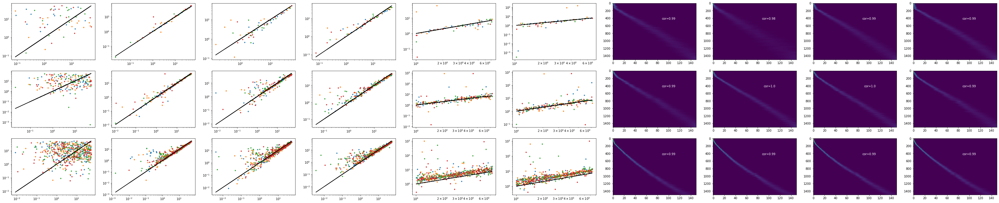

In [28]:
plot_fit_result(1500, true_tau=(0,0.1,1))

100%|██████████| 20/20 [04:48<00:00, 14.44s/it]


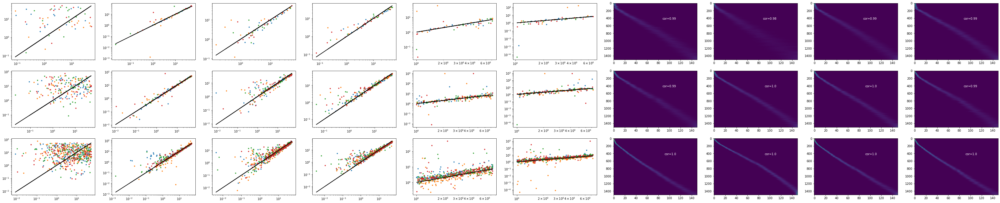

In [31]:
plot_fit_result(1500, true_tau=(0,0.1,1), warm=True, shuffle=True)

100%|██████████| 20/20 [05:48<00:00, 17.41s/it]


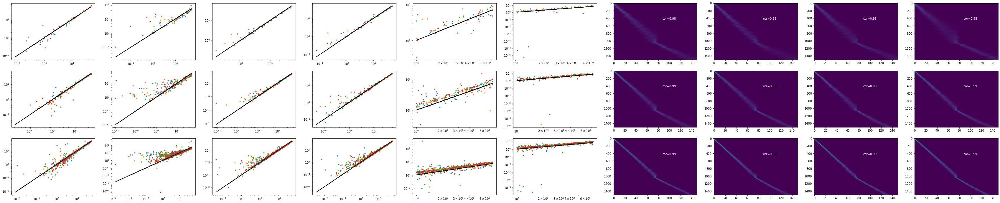

In [29]:
plot_fit_result(1500, true_tau=(0,0.7,1))

100%|██████████| 20/20 [05:20<00:00, 16.04s/it]


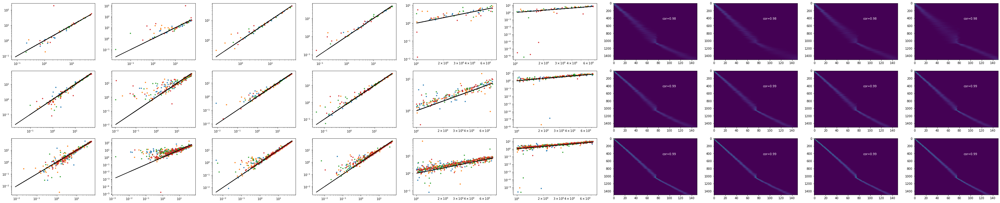

In [32]:
plot_fit_result(1500, true_tau=(0,0.7,1), warm=True, shuffle=True)